导入模型

In [1]:
from mmdet.apis import init_detector, inference_detector, show_result_pyplot
import mmcv

In [2]:
config_file = '../work_dirs/sparse_rcnn_r50_dcn_fpn_300_proposals_crop_mstrain_480-800_5x_crowdhuman/sparse_rcnn_r50_dcn_fpn_300_proposals_crop_mstrain_480-800_5x_crowdhuman.py'
checkpoint_file = '../work_dirs/sparse_rcnn_r50_dcn_fpn_300_proposals_crop_mstrain_480-800_5x_crowdhuman/sparse_rcnn_50e_ELoU_w_alpha.pth'

In [3]:
# build the model from a config file and a checkpoint file
model = init_detector(config_file, checkpoint_file, device='cuda:0')

load checkpoint from local path: ../work_dirs/sparse_rcnn_r50_dcn_fpn_300_proposals_crop_mstrain_480-800_5x_crowdhuman/sparse_rcnn_50e_ELoU_w_alpha.pth


2023-01-03 18:16:22,790 - root - INFO - DeformConv2dPack backbone.layer2.0.conv2 is upgraded to version 2.
2023-01-03 18:16:22,799 - root - INFO - DeformConv2dPack backbone.layer2.1.conv2 is upgraded to version 2.
2023-01-03 18:16:22,803 - root - INFO - DeformConv2dPack backbone.layer2.2.conv2 is upgraded to version 2.
2023-01-03 18:16:22,807 - root - INFO - DeformConv2dPack backbone.layer2.3.conv2 is upgraded to version 2.
2023-01-03 18:16:22,812 - root - INFO - DeformConv2dPack backbone.layer3.0.conv2 is upgraded to version 2.
2023-01-03 18:16:22,821 - root - INFO - DeformConv2dPack backbone.layer3.1.conv2 is upgraded to version 2.
2023-01-03 18:16:22,828 - root - INFO - DeformConv2dPack backbone.layer3.2.conv2 is upgraded to version 2.
2023-01-03 18:16:22,835 - root - INFO - DeformConv2dPack backbone.layer3.3.conv2 is upgraded to version 2.
2023-01-03 18:16:22,841 - root - INFO - DeformConv2dPack backbone.layer3.4.conv2 is upgraded to version 2.
2023-01-03 18:16:22,848 - root - INFO

In [4]:
model

SparseRCNN(
  (backbone): ResNet(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): ResLayer(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequential(
        

In [13]:
model.rpn_head.init_proposal_bboxes.weight

Parameter containing:
tensor([[0.5327, 0.5137, 0.9956, 0.9866],
        [0.5247, 0.5275, 0.9929, 0.9911],
        [0.5376, 0.4700, 1.0053, 1.0003],
        ...,
        [0.4409, 0.4597, 1.0208, 0.9988],
        [0.4401, 0.4893, 1.0163, 0.9857],
        [0.4988, 0.5224, 0.9743, 0.9919]], device='cuda:0', requires_grad=True)

In [4]:
img_path = '../data/crowdhuman/Images/284193,47770005a73ef7c.jpg'

In [83]:
import cv2

img = cv2.imread(img_path)

(1080, 1920, 3)


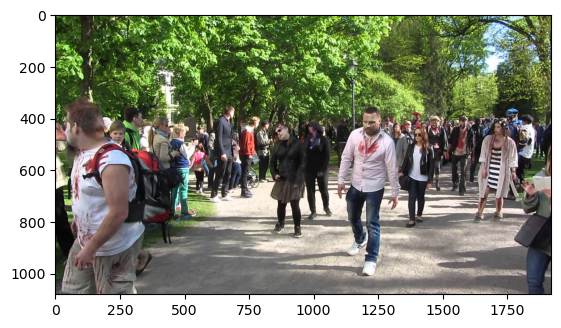

In [84]:
import matplotlib.pyplot as plt

img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
print(img.shape)
plt.imshow(img)
# plt.show()

In [5]:
result = inference_detector(model, img_path)

/home/pubNAS2/zihao/mmdetection/mmdet/datasets/utils.py:66: UserWarning: "ImageToTensor" pipeline is replaced by "DefaultFormatBundle" for batch inference. It is recommended to manually replace it in the test data pipeline in your config file.
  warnings.warn(
/home/pubNAS2/zihao/mmdetection/mmdet/models/roi_heads/sparse_roi_head.py:420: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  bbox_pred_per_img = predicted_boxes[img_id][topk_indices //


In [6]:
result[0].shape

(300, 29)

In [62]:
result[0][:,-1].argsort()[-20:]

array([ 75,  55,  89,  82, 268,  37, 138, 142, 201, 161,  28, 149, 253,
       204,  84, 298,  91, 277, 281, 289])

最后一阶段

In [69]:
result_last = [result_[138, -5:].reshape(1,-1) for result_ in result]

In [56]:
result_last[0].shape

(1, 5)

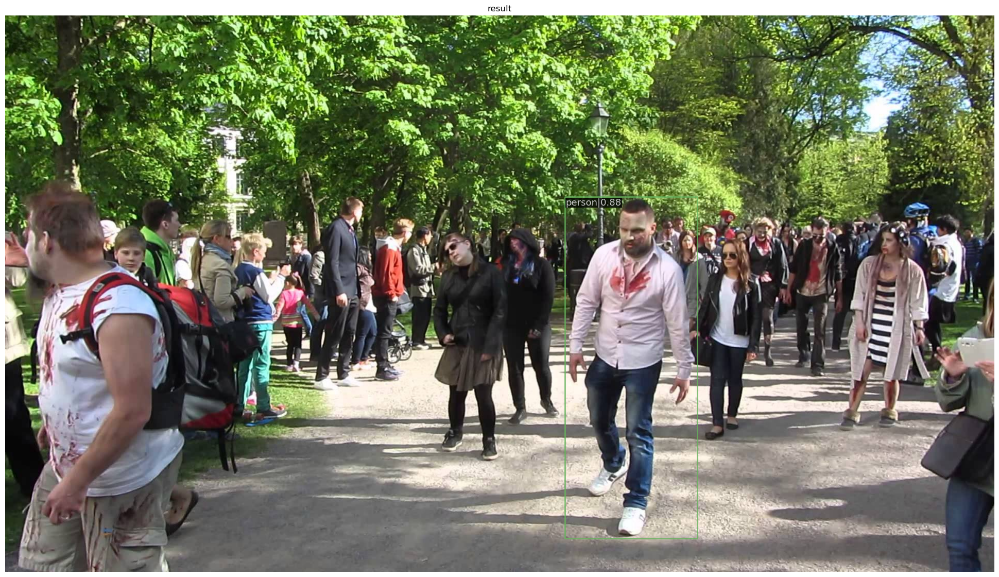

In [70]:
# show the results
show_result_pyplot(model, img_path, result_last)

In [76]:
i = 3 * 4
result_last = [result_[138, [i,i+ 1,i + 2, i + 3, 28]].reshape(1,-1) for result_ in result]
result_last[0].shape

(1, 5)

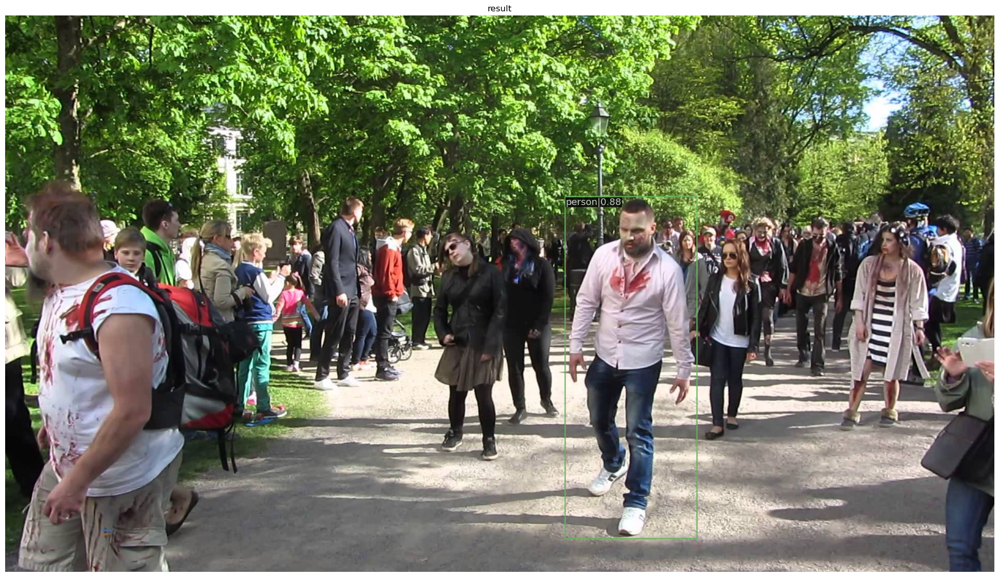

In [77]:
# show the results
show_result_pyplot(model, img_path, result_last)

分开几张图不能直观的看到结果，还是要放在一张图上。

In [78]:
result_last

[array([[1.08633325e+03, 3.51456299e+02, 1.34294092e+03, 1.01571594e+03,
         8.84680629e-01]], dtype=float32)]

In [85]:
import numpy as np

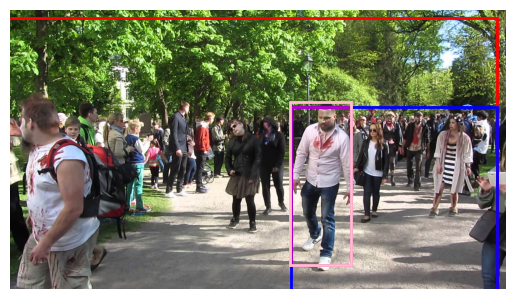

In [104]:
plt.imshow(img)

colors = ['r', 'y', 'b', 'g', 'm', 'k', 'pink']

for i in range(7):
    result_last = [result_[138, [i,i+ 1,i + 2, i + 3, 28]].reshape(1,-1) for result_ in result]
    result_int = result_last[0].astype(np.int32)[0]
    plt.gca().add_patch(
        plt.Rectangle((result_int[0], result_int[1]),result_int[2] - result_int[0],
                        result_int[3] - result_int[1],
                        fill=False,
                        edgecolor=colors[i], linewidth=2)
    )
    # plt.text(result_int[0], result_int[1], 
    #          f"iter {i}", 
    #          fontsize=15,
    #          backgroundcolor=colors[i])

plt.xticks([])  
plt.yticks([])  
plt.axis('off')
plt.show()

可视化 proposal bboxes.

In [14]:
from mmdet.core import bbox_cxcywh_to_xyxy

proposal_init = bbox_cxcywh_to_xyxy(model.rpn_head.init_proposal_bboxes.weight.clone())
proposal_init

tensor([[ 0.0349,  0.0204,  1.0305,  1.0070],
        [ 0.0282,  0.0319,  1.0211,  1.0230],
        [ 0.0349, -0.0302,  1.0402,  0.9701],
        ...,
        [-0.0695, -0.0397,  0.9513,  0.9591],
        [-0.0681, -0.0035,  0.9482,  0.9821],
        [ 0.0117,  0.0265,  0.9860,  1.0184]], device='cuda:0',
       grad_fn=<CatBackward0>)

In [17]:
import torch

h, w, _ = img.shape

img_whwh = torch.tensor([w, h, w, h]).reshape(1, 4).cuda()

proposals = proposal_init * img_whwh

In [18]:
proposals

tensor([[  67.0746,   22.0102, 1978.5406, 1087.5388],
        [  54.1383,   34.4421, 1960.5364, 1104.8799],
        [  67.0189,  -32.5843, 1997.1910, 1047.7177],
        ...,
        [-133.3932,  -42.8862, 1826.5670, 1035.8636],
        [-130.7275,   -3.8014, 1820.5690, 1060.7103],
        [  22.4618,   28.6004, 1893.0288, 1099.8513]], device='cuda:0',
       grad_fn=<MulBackward0>)

In [132]:
import numpy as np

proposal_arr = np.zeros((w, h))

for w1, h1, w2, h2 in proposals:
    w1 = max(min(w1, w), 0)    
    w2 = max(min(w2, w), 0)
    h1 = max(min(h1, h), 0)
    h2 = max(min(h2, h), 0)  
    
    proposal_arr[int(w1): int(w2),int(h1): int(h2) ] += 1
#     proposal_arr[int((w1+w2) / 2), int((h1+h2) / 2)] += 1

In [142]:
proposal_arr2 = np.exp(proposal_arr / 300)

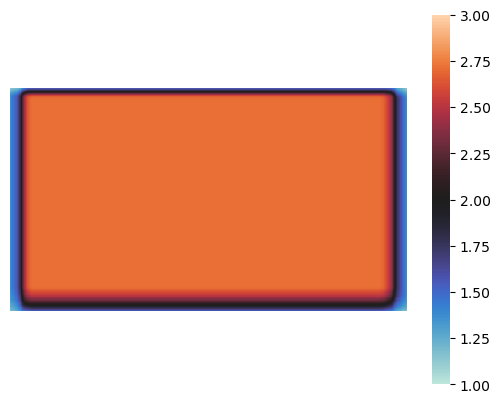

In [144]:
# plt.imshow(proposal_arr.T)
import seaborn as sns

sns.heatmap(proposal_arr2.T, vmin=1, vmax=3, center= 2)
plt.axis('equal')
plt.xticks([])
plt.yticks([])
plt.show()

In [127]:
centers = model.rpn_head.init_proposal_bboxes.weight.clone()[:, :2] * (img_whwh[:, :2] / 2)
centers[:10]

tensor([[511.4038, 277.3873],
        [503.6687, 284.8305],
        [516.0525, 253.7833],
        [454.7652, 268.5199],
        [466.2144, 239.6007],
        [507.7638, 268.2565],
        [487.6783, 267.7230],
        [478.9166, 252.1325],
        [467.3065, 278.4071],
        [481.8683, 269.2189]], device='cuda:0', grad_fn=<SliceBackward0>)

In [128]:
center_arr = np.zeros((w, h))

for w1, h1 in centers:
    w1 = max(min(w1, w), 0)    
    h1 = max(min(h1, h), 0) 
    
    center_arr[int(w1): int(w2),int(h1): int(h2) ] += 1

In [129]:
center_arr2 = np.log(center_arr + 1)

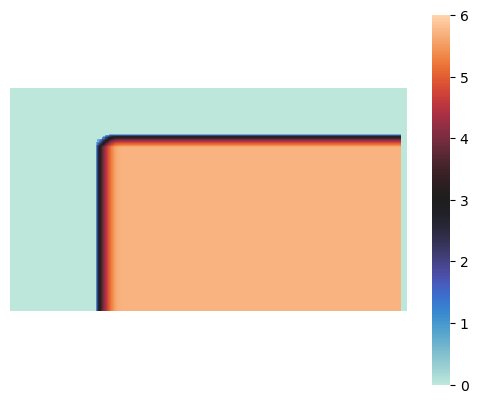

In [146]:
sns.heatmap(center_arr2.T, vmin=0, vmax=6, center= 3)
plt.axis('equal')
plt.xticks([])
plt.yticks([])
plt.show()

In [4]:
proposal = model.rpn_head.init_proposal_bboxes.weight.clone()

In [5]:
area = proposal[:, -1] * proposal[:, -2]
area

tensor([0.9822, 0.9841, 1.0056, 0.9849, 0.9370, 0.9983, 0.9542, 0.9145, 0.9586,
        0.9392, 0.9780, 0.9999, 0.9122, 0.9764, 0.9208, 0.9644, 0.9851, 0.9235,
        0.9206, 0.9859, 0.9769, 0.9386, 0.9318, 0.9437, 0.9824, 1.0057, 0.9899,
        0.9197, 0.9598, 0.9978, 0.9792, 0.9287, 0.9797, 0.9798, 0.9387, 0.9832,
        0.9646, 0.9796, 0.9712, 0.9592, 0.9776, 0.9467, 0.9707, 0.9426, 1.0505,
        0.9495, 0.9621, 0.9254, 0.9600, 1.0306, 1.0035, 0.9567, 0.9185, 0.9541,
        0.9396, 0.9684, 0.9878, 0.9558, 0.9977, 0.9871, 0.9760, 0.9401, 0.9347,
        0.9433, 0.9459, 0.9991, 0.9822, 0.9501, 0.9418, 0.9578, 0.9799, 0.9785,
        0.9412, 0.9631, 0.9676, 0.9955, 0.9785, 0.9457, 1.0071, 1.0059, 0.9227,
        0.9961, 0.9976, 0.9820, 0.9650, 0.9806, 0.9360, 0.9599, 0.9792, 0.9745,
        1.0008, 0.9723, 0.9803, 0.9941, 0.9872, 0.9407, 1.0121, 0.9748, 1.0207,
        1.0173, 0.9838, 0.9798, 1.0017, 0.9668, 0.9289, 0.9460, 0.9215, 0.9805,
        0.9155, 0.9754, 0.9727, 0.9598, 

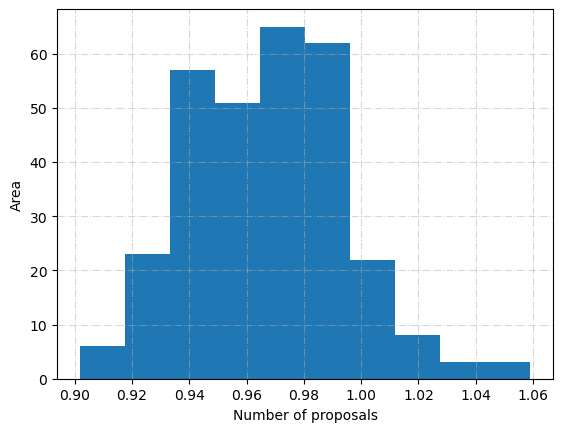

In [12]:
import matplotlib.pyplot as plt

plt.figure() #初始化一张图
x = area.cpu().detach().numpy()
plt.hist(x)  #直方图关键操作
plt.grid(alpha=0.5,linestyle='-.') #网格线，更好看 
plt.xlabel('Number of proposals')  
plt.ylabel('Area')  
# plt.title(r'Area frequency distribution histogram of proposals') 
plt.show()


关于 IoU Loss 梯度回归的一些尝试

In [1]:
import torch
import numpy as np

In [7]:
gt = torch.tensor([-1.0, 1.0, 1.0, -1.0], requires_grad=False) # (left_x, left_y, right_x, right_y)
anchor1 = torch.tensor([-1.0, 1.0, 1.0, -1.0], requires_grad=False)
anchor2 = torch.tensor([-1.0, 2.0, 1.0, -2.0], requires_grad=False)
anchor3 = torch.tensor([-2.0, 1.0, 2.0, -1.0], requires_grad=False)

In [15]:
bbox11 = torch.tensor(anchor1 - 1.0, requires_grad=True)
bbox12 = torch.tensor(anchor1 + 1.0, requires_grad=True)
bbox21 = torch.tensor(anchor2 - 1.0, requires_grad=True)
bbox22 = torch.tensor(anchor2 + 1.0, requires_grad=True)
bbox31 = torch.tensor(anchor3 - 1.0, requires_grad=True)
bbox32 = torch.tensor(anchor3 + 1.0, requires_grad=True)

/tmp/ipykernel_3692/640098625.py:1: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  bbox11 = torch.tensor(anchor1 - 1.0, requires_grad=True)
/tmp/ipykernel_3692/640098625.py:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  bbox12 = torch.tensor(anchor1 + 1.0, requires_grad=True)
/tmp/ipykernel_3692/640098625.py:3: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  bbox21 = torch.tensor(anchor2 - 1.0, requires_grad=True)
/tmp/ipykernel_3692/640098625.py:4: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone()

In [9]:
def IoU_Loss(bbox1, bbox2):
    # bbox:[left_x, left_y, right_x, right_y]
    x_I_left = torch.maximum(bbox1[0], bbox2[0])
    x_U_left = torch.minimum(bbox1[0], bbox2[0])
    y_I_left = torch.minimum(bbox1[1], bbox2[1])
    y_U_left = torch.maximum(bbox1[1], bbox2[1])

    x_I_right = torch.minimum(bbox1[2], bbox2[2])
    x_U_right = torch.maximum(bbox1[2], bbox2[2])
    y_I_right = torch.maximum(bbox1[3], bbox2[3])
    y_U_right = torch.minimum(bbox1[3], bbox2[3])

    S_I = (x_I_right - x_I_left) * (y_I_right - y_I_left)
    S_U = (x_U_right - x_U_left) * (y_U_right - y_U_left)

    return 1 - S_I / S_U
    

In [16]:
IoU_Loss11 = IoU_Loss(bbox11, gt)
IoU_Loss11.backward()
bbox11.grad

tensor([-0.0370, -0.1111, -0.1111, -0.0370])

In [17]:
IoU_Loss12 = IoU_Loss(bbox12, gt)
IoU_Loss12.backward()
bbox12.grad

tensor([0.1111, 0.0370, 0.0370, 0.1111])

In [19]:
IoU_Loss21 = IoU_Loss(bbox21, gt)
IoU_Loss21.backward()
bbox21.grad

tensor([-0.0556, -0.0208, -0.1667, -0.0417])

In [20]:
IoU_Loss22 = IoU_Loss(bbox22, gt)
IoU_Loss22.backward()
bbox22.grad

tensor([0.1667, 0.0417, 0.0556, 0.0208])

In [21]:
IoU_Loss31 = IoU_Loss(bbox31, gt)
IoU_Loss31.backward()
bbox31.grad

tensor([-0.0417, -0.1667, -0.0208, -0.0556])

In [22]:
IoU_Loss32 = IoU_Loss(bbox32, gt)
IoU_Loss32.backward()
bbox32.grad

tensor([0.0208, 0.0556, 0.0417, 0.1667])

In [23]:
def L2_Loss(bbox1, bbox2):
    return torch.sum(torch.pow(bbox1 - bbox2, 2.0))

In [25]:
L2_Loss(torch.tensor([1,1,1,1]), torch.tensor([3,3,3,3]))

tensor(16.)

In [27]:
bbox11.grad = None
bbox11.grad

In [28]:
bbox11.grad = None
L2_Loss11 = L2_Loss(bbox11, gt)
L2_Loss11.backward()
bbox11.grad

tensor([-2., -2., -2., -2.])

In [30]:
bbox12.grad = None
L2_Loss12 = L2_Loss(bbox12, gt)
L2_Loss12.backward()
bbox12.grad

tensor([2., 2., 2., 2.])

In [33]:
bbox21.grad = None
L2_Loss21 = L2_Loss(bbox21, gt)
L2_Loss21.backward()
bbox21.grad

tensor([-2.,  0., -2., -4.])

In [31]:
bbox22.grad = None
L2_Loss22 = L2_Loss(bbox22, gt)
L2_Loss22.backward()
bbox22.grad

tensor([2., 4., 2., 0.])

In [32]:
bbox31.grad = None
L2_Loss31 = L2_Loss(bbox31, gt)
L2_Loss31.backward()
bbox31.grad

tensor([-4., -2.,  0., -2.])

In [34]:
bbox32.grad = None
L2_Loss32 = L2_Loss(bbox32, gt)
L2_Loss32.backward()
bbox32.grad

tensor([0., 2., 4., 2.])

从上面 L2 和 IoU 的对比，可以发现，L2 Loss 只关心当前值的偏离程度，而 IoU Loss 会给更多整个 IoU 相关的信息，丰富了梯度信息，也让每一部分掌握了更多信息。这和 IoU Loss 提出的论文中论述的想用，让 bboxes 四个坐标获得的梯度更加丰富，有利于训练。当然上面也可以看到 IoU Loss 值比较小，还是 regression 的补充。